In [ ]:
# !pip install sklearn
# !pip install matplotlib
# !pip install pandas
# !pip install numpy
# !pip install seaborn

In [1]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('XY_Stellar.csv/XY_Stellar.csv')

In [181]:
df

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,redshift,plate,MJD,fiber_ID,Class
0,11.6447,21.2831,26.2810,26.1545,24.0457,18.8738,18.9963,8848,5,272,0.8383,7740,56824,833,NaN
1,173.0925,42.2122,22.5069,22.8322,22.2134,19.5500,19.9631,4156,3,486,0.8128,9041,58067,428,NaN
2,101.1591,20.4460,25.0819,25.3521,23.5971,19.6129,20.8940,3799,4,33,0.7085,9134,57370,409,NaN
3,31.9075,1.0176,22.0864,23.5868,19.3640,18.5630,18.2107,8589,1,610,0.3867,704,52136,463,NaN
4,4.7083,-1.1852,21.2645,22.3514,18.0653,17.4791,17.1469,4485,1,152,0.2140,4249,55417,243,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,130.6722,54.0968,20.4533,21.2826,17.3454,16.8643,16.5594,4480,1,77,0.0971,1876,53270,78,G
199996,251.8969,2.0071,27.9789,28.8686,21.6680,18.6255,18.7226,1489,4,771,-0.0001,4055,55594,359,S
199997,252.2881,38.3788,23.5094,24.3231,18.8953,17.6863,17.4353,4172,2,38,0.3273,5016,55991,794,G
199998,131.3059,44.2686,24.0728,24.6410,21.6306,19.2019,19.0269,7076,3,251,0.5455,6014,56166,1021,G


In [3]:
testing = df[df['Class'] != df['Class']]
testing = testing.drop('Class', axis=1)

In [4]:
df = df.dropna()

In [16]:
# df.describe()

,alpha,delta,u,g,r,i,z,run_ID,cam_col,field_ID,redshift,plate,MJD,fiber_ID
count,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000
mean,177.748579,25.972525,23.370149,23.628250,20.792761,17.974905,18.227227,4801.588919,3.504888,191.901594,0.610878,5210.212456,55523.199500,453.987425
std,98.240099,21.453036,2.771893,3.059065,2.233030,2.015137,1.848297,2229.390519,1.589412,160.788824,0.774788,3016.981183,1806.310309,278.179618
min,0.004800,-18.757500,-182.967419,-119.452295,-89.203674,-96.191240,-73.060366,109.000000,1.000000,11.000000,-0.010200,266.000000,51506.000000,1.000000
25%,124.713975,5.343625,21.478700,21.346275,19.237875,16.660975,16.945375,3387.000000,2.000000,82.000000,0.057500,2540.000000,54178.000000,220.000000
50%,178.962000,24.954350,23.391550,23.656000,21.077300,18.142300,18.407300,4383.000000,4.000000,147.000000,0.448200,5036.000000,55810.000000,434.000000
75%,235.418075,42.850800,25.173925,25.692200,22.330525,19.332425,19.423000,5713.000000,5.000000,247.000000,0.747100,7499.000000,56718.000000,654.000000
max,428.597100,97.463900,169.338190,111.990654,117.724404,124.049573,135.564273,9452.000000,6.000000,1157.000000,8.058400,12884.000000,58900.000000,1027.000000


In [5]:
enc1 = LabelEncoder()
enc1.fit(df['Class'])
df['Class'] = enc1.transform(df['Class'])

In [6]:
testing = testing.drop(['alpha','delta','run_ID','cam_col','field_ID','fiber_ID'], axis = 1)

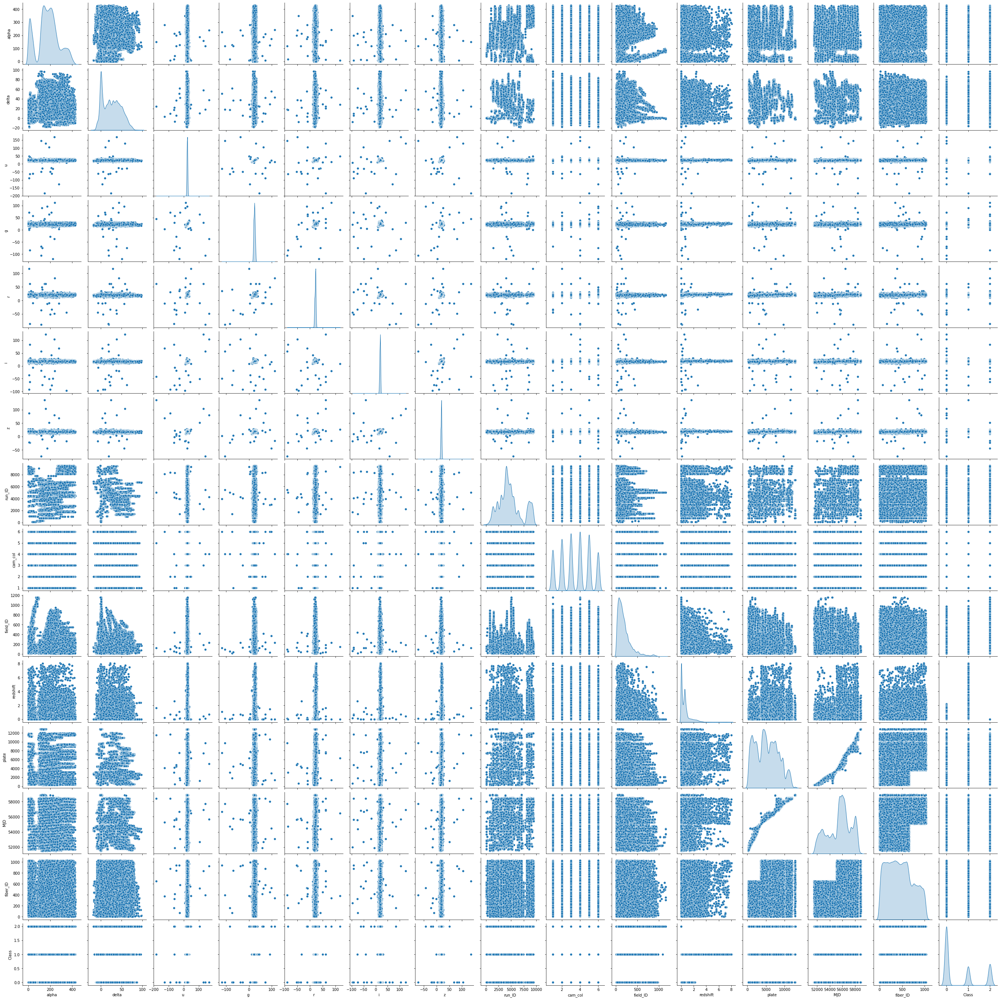

In [20]:
# sns.pairplot(df, diag_kind='kde')

In [7]:
df = df.drop(['alpha','delta','run_ID','cam_col','field_ID','fiber_ID'], axis = 1)

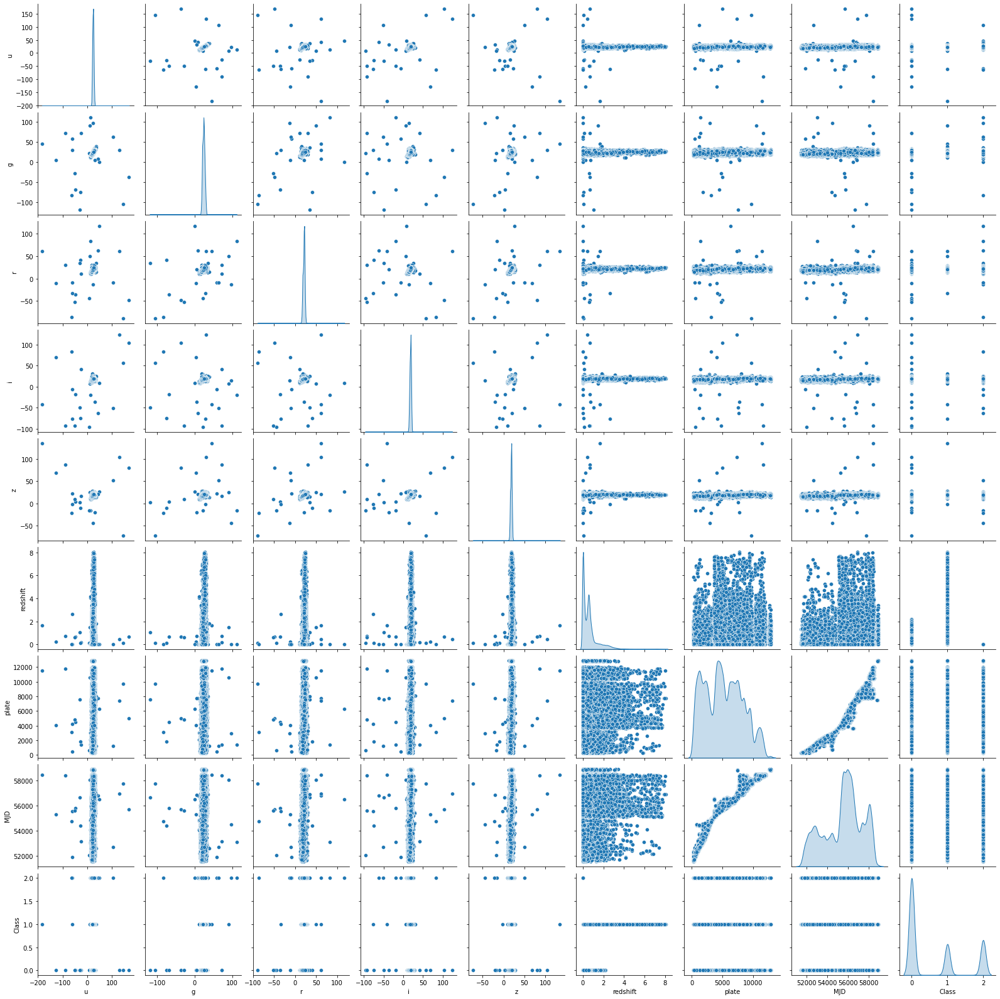

In [23]:
# sns.pairplot(df, diag_kind='kde')

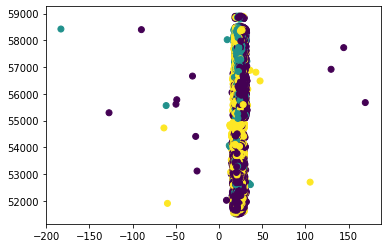

In [24]:
# plt.scatter(df['u'], df['MJD'], c=df['Class'])

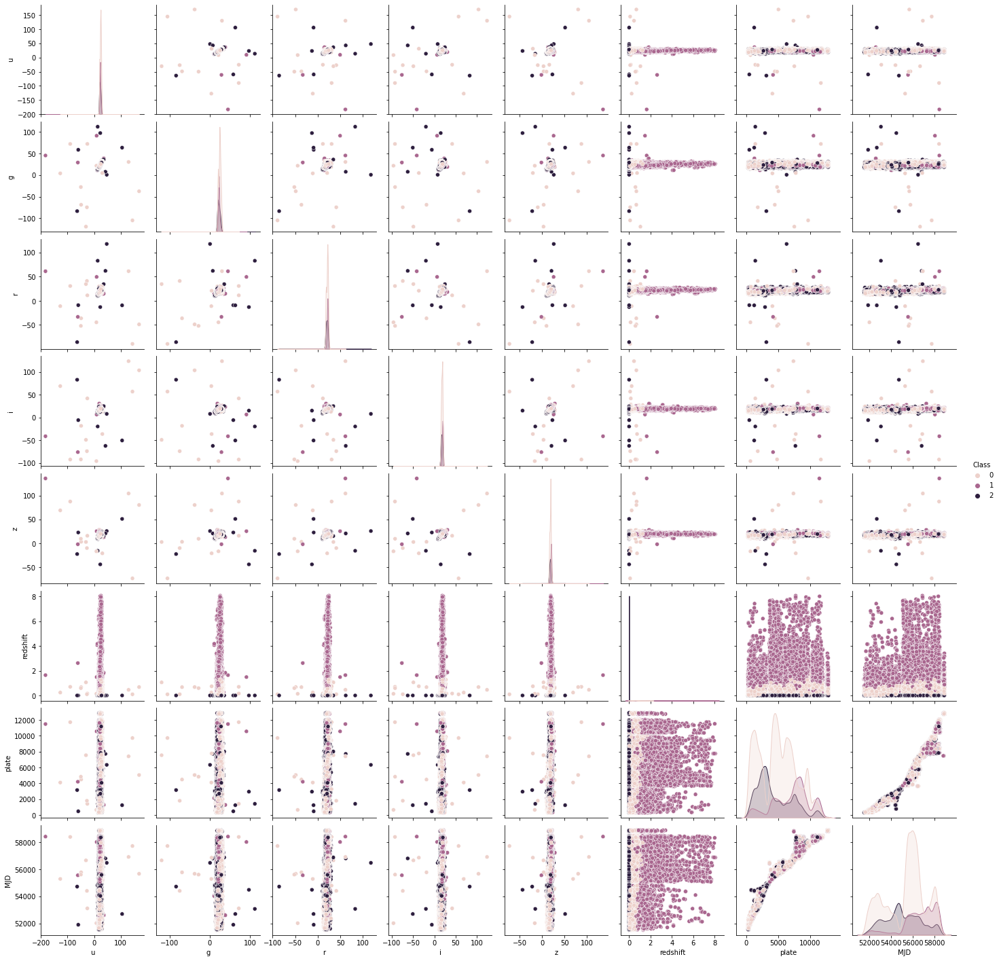

In [26]:
# sns.pairplot(df, hue='Class', diag_kind='kde')

In [8]:
df = df.drop(df[(df['u'] < 0) | (df['u'] > 50)].index)
df = df.drop(df[(df['r'] < 0) | (df['r'] > 40)].index)
df = df.drop(df[(df['g'] < 0) | (df['g'] > 40)].index)
df = df.drop(df[(df['i'] < 0) | (df['i'] > 40)].index)
df = df.drop(df[(df['z'] < 0) | (df['z'] > 40)].index)

In [40]:
# df.describe()

,u,g,r,i,z,redshift,plate,MJD,Class
count,159978.000000,159978.000000,159978.000000,159978.000000,159978.000000,159978.000000,159978.000000,159978.000000,159978.000000
mean,23.373621,23.630287,20.794737,17.978672,18.226925,0.610891,5210.204997,55523.205116,0.619716
std,2.568852,2.954912,2.136202,1.839714,1.756573,0.774802,3016.912008,1806.289626,0.815579
min,11.887700,11.132400,10.459300,8.747200,9.245600,-0.010200,266.000000,51506.000000,0.000000
25%,21.479100,21.346500,19.238225,16.661425,16.945700,0.057600,2540.000000,54178.000000,0.000000
50%,23.391650,23.656000,21.077300,18.142500,18.407300,0.448200,5036.000000,55810.000000,0.000000
75%,25.173800,25.692100,22.330500,19.332400,19.422875,0.747100,7499.000000,56718.000000,1.000000
max,36.384200,38.708500,34.476700,30.737900,28.161900,8.058400,12884.000000,58900.000000,2.000000


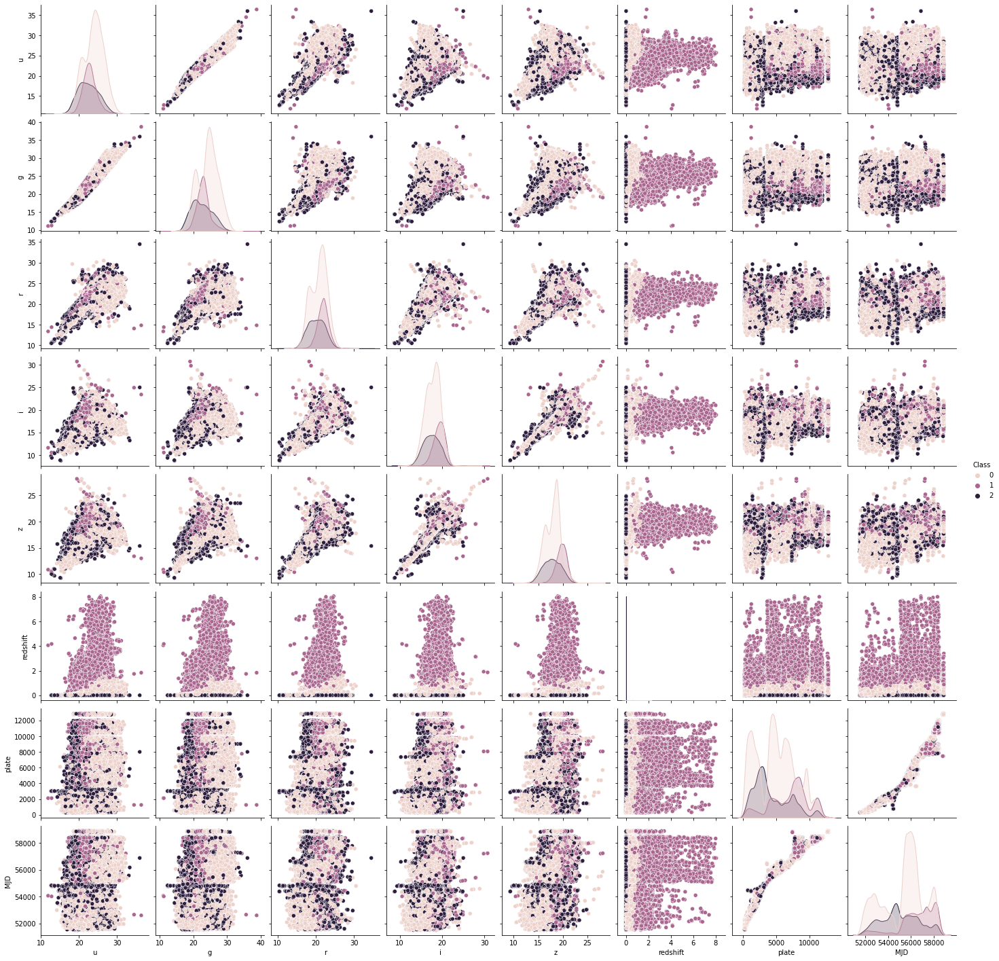

In [41]:
# sns.pairplot(df, hue='Class')

In [9]:
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor()
y_pred = clf.fit_predict(df) 

In [65]:
# df.index

Int64Index([ 40000,  40001,  40002,  40003,  40004,  40005,  40006,  40007,
             40008,  40009,
            ...
            199990, 199991, 199992, 199993, 199994, 199995, 199996, 199997,
            199998, 199999],
           dtype='int64', length=159978)

In [10]:
x_score = clf.negative_outlier_factor_
outlier_score = pd.DataFrame(x_score, index=df.index)

In [11]:
df = df.drop(outlier_score[outlier_score[0] < -2].index)

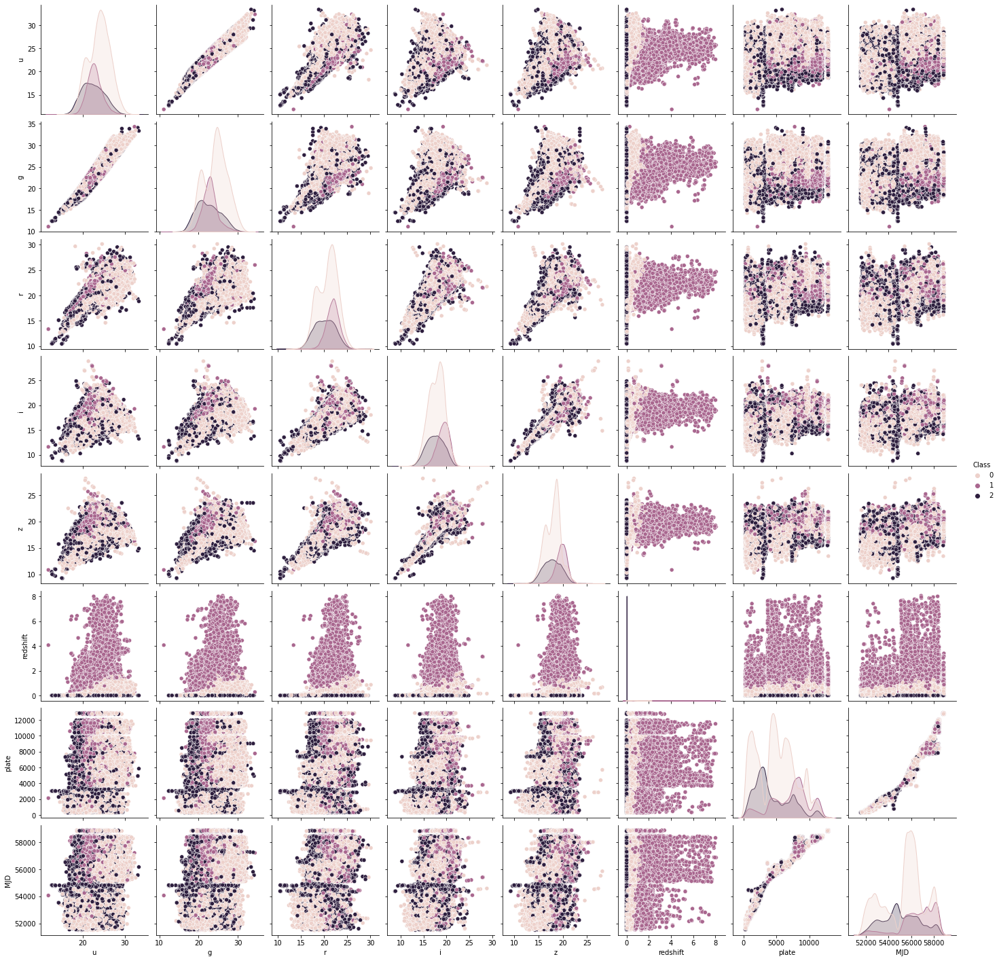

In [78]:
# sns.pairplot(df, hue='Class')

In [12]:
df_y = df['Class']
df_x = df.drop('Class', axis=1)

In [84]:
# df_x['Class'] = df_y

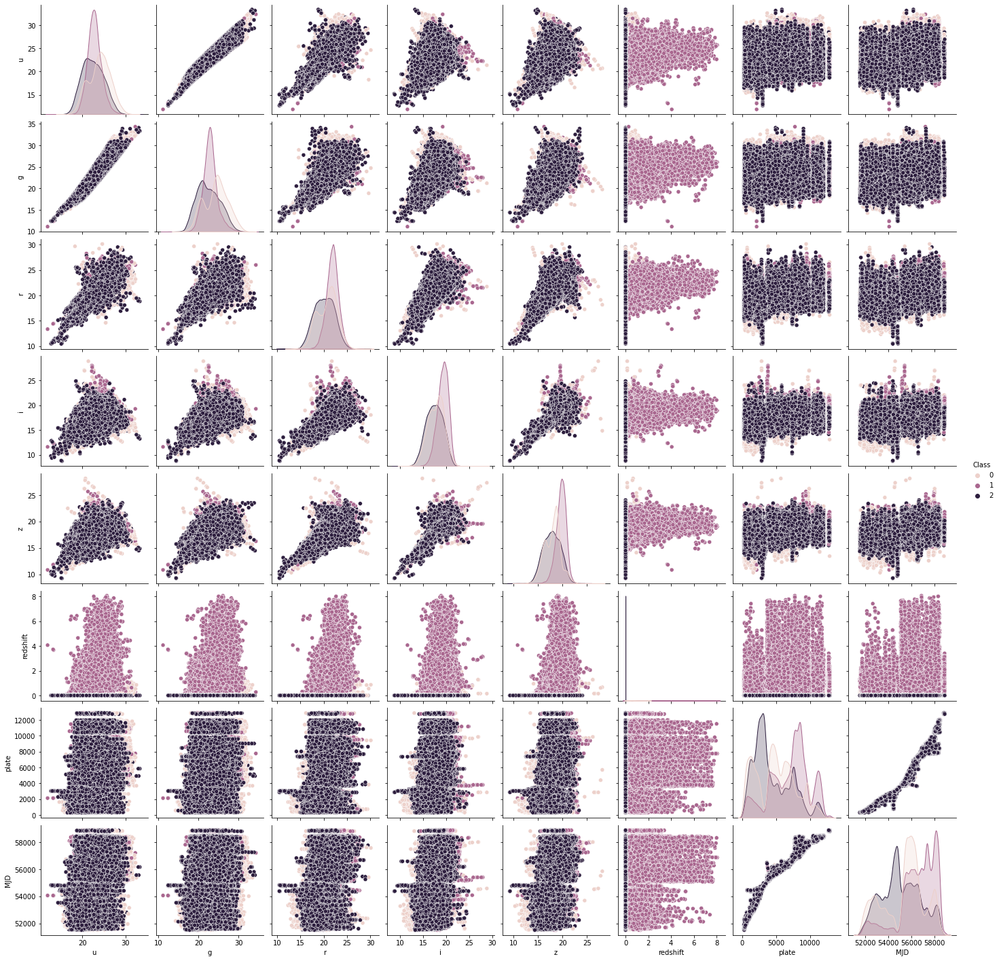

In [85]:
# sns.pairplot(df_x, hue='Class', diag_kind='kde')

In [86]:
# df_x = df_x.drop('Class', axis=1)

In [13]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df_x)
df_x = scaler.transform(df_x)

In [14]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2).fit(df_x)
df_x = poly.transform(df_x)

In [15]:
scaler_after = StandardScaler()
scaler_after.fit(df_x)
df_x = scaler_after.transform(df_x)

In [16]:
testing = scaler.transform(testing)
testing = poly.transform(testing)
testing = scaler_after.transform(testing)

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size = 0.2, random_state = 99)

In [18]:
dl = len(x_train) // 2
x_train_first = x_train[:dl,]
x_train_second = x_train[dl:,]
y_train_first = y_train[:dl,]
y_train_second = y_train[dl:,]

In [20]:
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.linear_model import LogisticRegression

orc = OneVsRestClassifier(LogisticRegression(solver='lbfgs', max_iter=1000, penalty='none', warm_start=True)).fit(x_train_first, y_train_first)

sklearn.metrics.accuracy_score(y_test, orc.predict(x_test))

C:\Users\georgyshamteev\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9660825679445786

In [21]:
x_train_second = pd.DataFrame(x_train_second)
x_train_second[45] = orc.predict(x_train_second)
x_train_second

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,0.0,0.978405,0.721460,0.842300,0.441502,0.647612,4.088881,1.076261,0.775267,-0.033473,...,2.157569,0.070554,-0.146087,4.487100,4.271305,3.161829,0.150098,-0.131873,-0.359373,1
1,0.0,-0.169467,0.564279,-0.216438,0.715848,0.372223,-0.085506,0.528547,0.428070,-0.760958,...,-0.516995,-0.458568,-0.502779,-0.283371,-0.462081,-0.482974,-0.683141,-0.728416,-0.735711,0
2,0.0,0.698760,1.361731,0.588417,1.015327,0.594848,-0.192995,0.761292,0.828980,-0.400923,...,-0.599807,-0.187678,-0.155407,-0.274826,-0.570391,-0.623223,-0.398558,-0.331291,-0.281754,0
3,0.0,0.970380,1.285443,0.048692,-0.431420,-0.452917,-0.110797,0.292486,0.255856,-0.045724,...,-0.435147,-0.806771,-0.789206,-0.281954,-0.448467,-0.473592,-0.866869,-0.876950,-0.841806,0
4,0.0,-1.067961,-0.664118,-0.071971,1.189519,1.081009,1.355206,0.869708,0.959110,0.110107,...,0.976877,0.327745,0.410423,0.238809,0.840884,1.036058,-0.230933,-0.132112,-0.072159,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63797,0.0,-0.341679,-0.308005,0.621968,1.466857,1.687912,2.868954,1.077587,1.078719,-0.691994,...,4.347786,1.257149,1.226325,2.064117,2.877495,3.076373,0.152806,0.189898,0.147397,1
63798,0.0,-0.212705,-0.001160,-0.912907,-0.366193,-0.703747,-0.788635,-1.371873,-1.620227,-0.748012,...,0.068678,0.354494,0.518058,-0.107919,0.737904,1.011024,0.836140,1.230019,1.463877,2
63799,0.0,0.464223,0.764057,-0.048401,0.875787,0.430401,-0.151831,0.288508,0.277452,-0.614621,...,-0.550450,-0.535318,-0.544326,-0.278877,-0.460602,-0.489252,-0.869061,-0.871837,-0.831431,0
63800,0.0,0.454991,0.298134,1.578037,0.802998,0.770975,2.254086,0.828927,0.730414,-0.621269,...,1.249197,0.009296,-0.082541,1.164927,1.575333,1.430054,-0.296599,-0.356439,-0.420206,1


In [22]:
x_test_new = pd.DataFrame(x_test).copy()
x_test_new[45] = orc.predict(x_test)
x_test_new

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
0,0.0,0.450122,0.016447,1.072379,-0.132431,0.236210,-0.790313,-0.401770,-0.162220,-0.624722,...,-0.671543,-0.767033,-0.708483,-0.107163,-0.075908,-0.295643,-0.794946,-0.886425,-0.877068,2
1,0.0,0.629891,0.823753,-0.291366,-0.355476,-0.413315,-0.316355,-1.510791,-1.907620,-0.472612,...,-0.354733,-0.006198,0.151952,-0.256889,0.094888,0.244591,1.215756,1.876722,2.377150,0
2,0.0,-1.358045,-1.428861,-1.554458,-1.351073,-1.412304,-0.788635,-0.748236,-0.565899,0.661463,...,0.626372,0.451045,0.163164,-0.107919,0.214278,0.065910,-0.417241,-0.535003,-0.612307,2
3,0.0,1.255634,1.722754,-0.684937,-0.116274,-0.388985,-0.343969,-0.918650,-0.991174,0.451756,...,-0.351695,-0.288700,-0.267353,-0.251684,-0.077544,-0.053842,-0.147961,-0.057172,-0.015830,0
4,0.0,2.552502,2.399730,0.765357,-0.690860,-0.333998,-0.020212,-0.371600,-0.155022,4.320981,...,-0.478493,-0.535382,-0.614720,-0.285341,-0.405968,-0.437808,-0.817065,-0.893850,-0.879125,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31896,0.0,2.541556,2.083674,1.972874,0.004551,0.136550,0.345869,1.863682,1.460802,4.277296,...,-0.438095,-0.397488,-0.461009,-0.251310,0.272307,0.132926,2.344614,1.720218,1.021423,0
31897,0.0,0.240671,0.058265,0.915822,1.485190,1.538394,-0.790055,-0.046022,0.167257,-0.738079,...,-1.698255,-0.741540,-0.400819,-0.107279,-0.375254,-0.591570,-0.945958,-0.957909,-0.875573,2
31898,0.0,-0.690660,-0.390117,0.022966,0.834769,0.861461,2.252022,0.702940,0.543803,-0.409740,...,1.450983,-0.026165,-0.181063,1.162271,1.271438,0.950653,-0.479553,-0.575384,-0.634395,1
31899,0.0,1.990252,1.722076,1.339899,-0.501163,-0.244766,0.047146,-0.002589,0.192175,2.319901,...,-0.496747,-0.665986,-0.717559,-0.284824,-0.414094,-0.431071,-0.947960,-0.950846,-0.867506,0


In [23]:
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
ooc = OneVsOneClassifier(
    LogisticRegression(solver='lbfgs',
                         penalty='none',
                         max_iter=1200, #1200
                         tol = 1e-4,
                         random_state=69)).fit(x_train_second, y_train_second)

sklearn.metrics.accuracy_score(y_test, ooc.predict(x_test_new))
#0.9702830632268581

C:\Users\georgyshamteev\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9703144102065766

In [ ]:
0.966427384721482
0.9700949813485471

In [173]:
testing = pd.DataFrame(testing)
testing

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
0,0.0,1.131841,0.854160,1.522603,0.486764,0.437979,0.293221,0.838211,0.719893,0.220202,...,-0.604508,-0.357058,-0.278358,-0.340467,-0.260915,-0.152290,-0.201433,-0.281928,-0.358438,-0.433951
1,0.0,-0.338290,-0.270792,0.664001,0.854625,0.988870,0.260317,1.269552,1.408196,-0.693799,...,-0.016557,-0.228317,0.661193,0.780626,-0.266114,-0.062108,-0.024694,0.579929,0.803343,0.885474
2,0.0,0.664754,0.582462,1.312392,0.888844,1.519306,0.125730,1.300385,1.022237,-0.437250,...,0.978589,-0.294584,1.423007,0.947732,-0.280946,-0.239895,-0.295279,0.655047,0.353606,0.040506
3,0.0,-0.502088,-0.015280,-0.671207,0.317685,-0.009663,-0.289515,-1.494545,-1.876056,-0.585955,...,-0.747922,-0.482438,-0.651381,-0.649739,-0.261531,0.046709,0.176006,1.169472,1.800048,2.269575
4,0.0,-0.822244,-0.433594,-1.279769,-0.271970,-0.615826,-0.512364,-0.319215,-0.059224,-0.253774,...,-0.464322,-0.170324,-0.458734,-0.630648,-0.210520,-0.239834,-0.406878,-0.851370,-0.931813,-0.897613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.0,-0.389046,-0.990467,-0.473039,-1.725572,-1.379313,-0.788377,-0.621917,-0.352708,-0.664877,...,0.675065,0.600049,0.240650,-0.162299,-0.108035,0.108046,-0.125300,-0.581312,-0.735184,-0.788714
39996,0.0,-1.162850,-0.579703,-1.500241,-0.525045,-0.886029,-0.619853,-1.339713,-1.593093,0.275951,...,-0.160783,0.062897,0.588850,0.800404,-0.175780,0.470160,0.681068,0.753473,1.143248,1.385340
39997,0.0,1.531929,1.826503,0.595492,0.395751,0.291937,0.081212,-0.262190,-0.034306,1.055167,...,-0.684242,-0.461568,-0.747615,-0.679028,-0.283575,-0.436634,-0.444536,-0.882800,-0.941535,-0.899712
39998,0.0,0.237749,0.331555,-0.056461,0.147300,0.023671,-0.078667,0.192360,0.428624,-0.739174,...,-0.747572,-0.487089,-0.661840,-0.658046,-0.283691,-0.430075,-0.479696,-0.912889,-0.869480,-0.735284


In [174]:
testing[45] = orc.predict(testing)
res = ooc.predict(testing)
pd.DataFrame(res)

,0
0,0
1,0
2,0
3,0
4,0
...,...
39995,2
39996,0
39997,0
39998,0


In [177]:
ToCSV = lambda df, fname: df.to_csv(f'{fname}.csv', index_label='id')
submit_final = pd.DataFrame(enc1.inverse_transform(ooc.predict(testing)), columns=['Class'])
submit_final.index += 1
ToCSV(submit_final, 'orc_ooc_1')

In [178]:
submit_final

,Class
1,G
2,G
3,G
4,G
5,G
...,...
39996,S
39997,G
39998,G
39999,G
